In [1]:
%load_ext autoreload
%autoreload 2

from volume_fish import VolumeFish
from utils import *
from mesm import *
import pandas as pd
import numpy as np
from caiman_process import caiman_cnmf, plot_components
import caiman as cm
from caiman.source_extraction.cnmf import cnmf as cnmf

from fastplotlib import ImageWidget, GridPlot
from ipywidgets import VBox
import matplotlib.pyplot as plt
import bokeh.plotting as bpl
bpl.output_notebook()

pd.options.display.max_colwidth = 120

Loading BokehJS ...

### Change the exp_folder to the path of the experiment

In [2]:
exp_folder = r'C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405'

In [3]:
#Create fish

fish = VolumeFish(exp_folder)
fish.data_paths

Batch exists. Loading batch.pickle


{'injection': WindowsPath('C:/Users/minel/Documents/data/elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405/injection.txt'),
 'log': WindowsPath('C:/Users/minel/Documents/data/elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405/log.549.txt'),
 'postgavage_path': WindowsPath('C:/Users/minel/Documents/data/elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405/postgavage_vagal_L'),
 'cropped': WindowsPath('C:/Users/minel/Documents/data/elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405/postgavage_vagal_L/img_cropped.tif'),
 'mesmerize': WindowsPath('C:/Users/minel/Documents/data/elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405/postgavage_vagal_L/mesmerize-batch'),
 'opts': WindowsPath('C:/Users/minel/Documents/data/elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405/postgavage_vagal_L/opts.pkl'),
 'raw_image': WindowsPath('C:/Users/minel/Documents/data/elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405/postgavage_vagal_L/postgavage_vagal_L.ch1.tif'),
 'frametimes': WindowsPath('C:/Use

## Pick a plane to apply source extraction

In [4]:
mes_df = load_mesmerize(fish)
iw = visualize_mesmerize(mes_df, 'mcorr')
iw.show()

Batch exists. Loading batch.pickle
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884-image_els__d1_400_d2_400_d3_1_order_F_frames_778.mmap
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3\bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3-image_els__d1_400_d2_400_d3_1_order_F_frames_779.mmap
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\3746e763-d38a-4a74-b3ac-5179cb0eeae9\3746e763-d38a-4a74-b3ac-5179cb0eeae9-image_els__d1_400_d2_400_d3_1_order_F_frames_779.mmap
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\6f89e7a0-b750-4fa0-8438-2971f

RFBOutputContext()

No such comm: f0286196c18d4527b858a9e23f5b6b31
No such comm: f0286196c18d4527b858a9e23f5b6b31


In [5]:
iw.plot.canvas.close()

In [27]:
plane = 4

## Set parameters

In [7]:
# parameters for source extraction and deconvolution
rf = 15                     # half-size of the patches in pixels. e.g., if rf=25, patches are 50x50
stride_cnmf = 6             # amount of overlap between the patches in pixels
K = 7                       # number of components per patch
gSig = [3, 3]               # expected half size of neurons in pixels

p = 1                       # order of the autoregressive system
nb = 2                     # number of global background components
merge_thr = 0.85            # merging threshold, max correlation allowed
method_init = 'greedy_roi'  # initialization method (if analyzing dendritic data using 'sparse_nmf')

# parameters for component evaluation
min_SNR = 2.0               # signal to noise ratio for accepting a component
rval_thr = 0.85             # space correlation threshold for accepting a component
cnn_thr = 0.99              # threshold for CNN based classifier
cnn_lowest = 0.1            # neurons with cnn probability lower than this value are rejected

In [8]:
opts_dict = {'p': p,
            'gnb': nb,
            'merge_thr': merge_thr,
            'rf': rf,
            'stride_cnmf': stride_cnmf,
            'K': K,
            'gSig': gSig,
            'method_init': method_init,
            'min_SNR': min_SNR,
            'rval_thr': rval_thr,
            'cnn_thr': cnn_thr,
            'cnn_lowest': cnn_lowest}

## Run CNMF

In [9]:
cnm, images = caiman_cnmf(fish, plane=plane, **opts_dict)

Batch exists. Loading batch.pickle
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_500mM_27_20221228\postgavage_hindbrain\img_stack_6\1d9cadc1-48c7-44d8-81ca-365a32b220b9_cnmf-memmap_d1_250_d2_250_d3_1_order_C_frames_624.mmap


      198262 [params.py:       change_params():1067] [18148] No parameter gnb found!
      198263 [params.py:       change_params():1067] [18148] No parameter stride_cnmf found!
      198264 [params.py:       change_params():1067] [18148] No parameter cnn_thr found!


Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_500mM_27_20221228\postgavage_hindbrain\img_stack_6\1d9cadc1-48c7-44d8-81ca-365a32b220b9_cnmf-memmap_d1_250_d2_250_d3_1_order_C_frames_624.mmap
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_500mM_27_20221228\postgavage_hindbrain\img_stack_6\1d9cadc1-48c7-44d8-81ca-365a32b220b9_cnmf-memmap_d1_250_d2_250_d3_1_order_C_frames_624.mmap
GPU run not requested, disabling use of GPUs
USING MODEL (keras API): C:\Users\minel\caiman_data\model\cnn_model.json
15/15 [==============================] - 1s 22ms/step


In [10]:
# plot contours of found components
plot_components(cnm, images)

View traces of accepted components. Note that if you get data rate error you can start Jupyter notebooks using: 'jupyter notebook --NotebookApp.iopub_data_rate_limit=1.0e10'

Denoised traces in red, full traces in blue (Y=AYr+AC)

In [11]:
# accepted components
plot_components(cnm, images, key='good')

In [12]:
# rejected components
plot_components(cnm, images, key='bad')

## Optimize parameters with Mesmerize

In [50]:
plane = 0

### Clean Mesmerize

In [10]:
clean_mesmerize(mes_df, [], keep_algo='mcorr')

,algo,item_name,input_movie_path,params,outputs,added_time,ran_time,algo_duration,comments,uuid
0,mcorr,img_stack_2,img_stack_2\image.tif,"{'main': {'strides': (30, 30), 'overlaps': (15, 15), 'max_shifts': (15, 15), 'max_deviation_rigid': 10, 'pw_rigid': ...",{'mean-projection-path': e4ad8654-c3d6-41a4-9b79-90f0d1ce80dd\e4ad8654-c3d6-41a4-9b79-90f0d1ce80dd_mean_projection.n...,2023-05-21T16:55:55,2023-05-21T16:57:13,71.88 sec,None,e4ad8654-c3d6-41a4-9b79-90f0d1ce80dd
1,mcorr,img_stack_0,img_stack_0\image.tif,"{'main': {'strides': (30, 30), 'overlaps': (15, 15), 'max_shifts': (15, 15), 'max_deviation_rigid': 10, 'pw_rigid': ...",{'mean-projection-path': a686b61a-e485-4d58-b3d6-acd05f071ad6\a686b61a-e485-4d58-b3d6-acd05f071ad6_mean_projection.n...,2023-05-21T17:07:18,2023-05-21T17:08:32,73.17 sec,None,a686b61a-e485-4d58-b3d6-acd05f071ad6
2,mcorr,img_stack_1,img_stack_1\image.tif,"{'main': {'strides': (30, 30), 'overlaps': (15, 15), 'max_shifts': (15, 15), 'max_deviation_rigid': 10, 'pw_rigid': ...",{'mean-projection-path': dfc32d85-3145-4aed-b0b3-0c1871bc0a2d\dfc32d85-3145-4aed-b0b3-0c1871bc0a2d_mean_projection.n...,2023-05-21T17:07:18,2023-05-21T17:09:45,72.77 sec,None,dfc32d85-3145-4aed-b0b3-0c1871bc0a2d
3,mcorr,img_stack_3,img_stack_3\image.tif,"{'main': {'strides': (30, 30), 'overlaps': (15, 15), 'max_shifts': (15, 15), 'max_deviation_rigid': 10, 'pw_rigid': ...",{'mean-projection-path': 14a7e969-0de2-4d35-965d-c8a955ca7963\14a7e969-0de2-4d35-965d-c8a955ca7963_mean_projection.n...,2023-05-21T17:07:18,2023-05-21T17:10:59,73.84 sec,None,14a7e969-0de2-4d35-965d-c8a955ca7963


### CNMF parameters

In [49]:
rf = [25]  # half-size of the patches in pixels. e.g., if rf=25, patches are 50x50
stride = [10]  # amount of overlap between the patches in pixels
K = [2]  # number of components per patch
merge_thr = [0.999]  # mergi--ng threshold, max correlation allowed -> above this thresh, ROIs are merged together
gSig = [10, 11, 12]  # expected half size of neurons in pixels
min_SNR = [1.5]  # signal to noise ratio for accepting a component, [1, 2, 2.5, 3]
min_cnn_thr = [0.80]  # threshold for CNN based classifier

nb = [2, 3]  # number of global background components

In [50]:
img_path = fish.data_paths['volumes'][str(plane)]['mcorr']

mes_df = add_cnmf(fish, [img_path], grid=True, 
                  rf=rf,
                  stride=stride,
                  K=K, 
                  merge_thr=merge_thr,
                  gSig=gSig,
                  min_SNR=min_SNR,
                  min_cnn_thr=min_cnn_thr,
                  nb=nb)

Batch exists. Loading batch.pickle


In [51]:
mes_df

,algo,item_name,input_movie_path,params,outputs,added_time,ran_time,algo_duration,comments,uuid
0,mcorr,img_stack_4,img_stack_4\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884_mean_projection.n...,2023-05-22T11:29:03,2023-05-22T11:30:04,58.79 sec,None,cdd2a404-8ca8-47fe-8083-6fec24622884
1,mcorr,img_stack_0,img_stack_0\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3\bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3_mean_projection.n...,2023-05-22T11:30:05,2023-05-22T11:31:04,58.73 sec,None,bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3
2,mcorr,img_stack_1,img_stack_1\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': 3746e763-d38a-4a74-b3ac-5179cb0eeae9\3746e763-d38a-4a74-b3ac-5179cb0eeae9_mean_projection.n...,2023-05-22T11:30:05,2023-05-22T11:32:03,58.78 sec,None,3746e763-d38a-4a74-b3ac-5179cb0eeae9
3,mcorr,img_stack_2,img_stack_2\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': 6f89e7a0-b750-4fa0-8438-2971f7f09ab8\6f89e7a0-b750-4fa0-8438-2971f7f09ab8_mean_projection.n...,2023-05-22T11:30:05,2023-05-22T11:33:02,58.76 sec,None,6f89e7a0-b750-4fa0-8438-2971f7f09ab8
4,mcorr,img_stack_3,img_stack_3\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': 53a4cc4d-4dbe-4447-a1ae-8517bd26bd70\53a4cc4d-4dbe-4447-a1ae-8517bd26bd70_mean_projection.n...,2023-05-22T11:30:05,2023-05-22T11:34:01,58.8 sec,None,53a4cc4d-4dbe-4447-a1ae-8517bd26bd70
5,cnmf,cdd2a404-8ca8-47fe-8083-6fec24622884,cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884-image_els__d1_400_d2_400_d3_1_order_F_fram...,"{'main': {'fr': 0.7973573299920267, 'p': 1, 'nb': 2, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 2, 'gSig': (10...",None,2023-05-22T11:59:31,None,None,None,fd524ee0-819b-4392-a988-6e0e6e046eaf
6,cnmf,cdd2a404-8ca8-47fe-8083-6fec24622884,cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884-image_els__d1_400_d2_400_d3_1_order_F_fram...,"{'main': {'fr': 0.7973573299920267, 'p': 1, 'nb': 3, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 2, 'gSig': (10...",None,2023-05-22T11:59:31,None,None,None,f1549862-8335-47f7-9a18-cf63e0962f22
7,cnmf,cdd2a404-8ca8-47fe-8083-6fec24622884,cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884-image_els__d1_400_d2_400_d3_1_order_F_fram...,"{'main': {'fr': 0.7973573299920267, 'p': 1, 'nb': 2, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 2, 'gSig': (11...",None,2023-05-22T11:59:31,None,None,None,6e884281-1844-436f-99f6-2910e1422880
8,cnmf,cdd2a404-8ca8-47fe-8083-6fec24622884,cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884-image_els__d1_400_d2_400_d3_1_order_F_fram...,"{'main': {'fr': 0.7973573299920267, 'p': 1, 'nb': 3, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 2, 'gSig': (11...",None,2023-05-22T11:59:31,None,None,None,7e0955b3-94e5-41f2-b163-3be4bc5c81ce
9,cnmf,cdd2a404-8ca8-47fe-8083-6fec24622884,cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884-image_els__d1_400_d2_400_d3_1_order_F_fram...,"{'main': {'fr': 0.7973573299920267, 'p': 1, 'nb': 2, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 2, 'gSig': (12...",None,2023-05-22T11:59:31,None,None,None,b8003c5b-51ca-460a-af0e-6ebafa899651


In [52]:
# See the unique parameters between rows with the same item_name
diffs = mes_df.caiman.get_params_diffs(algo="cnmf", item_name=Path(img_path).parent.name)
diffs

C:\Users\minel\AppData\Local\Temp\ipykernel_29744\1470305159.py:2: FutureWarning: You are trying to use the following experimental feature, this may change in the future without warning:
CaimanDataFrameExtensions.get_params_diffs
This feature is new and the might improve in the future

  diffs = mes_df.caiman.get_params_diffs(algo="cnmf", item_name=Path(img_path).parent.name)


5     {'gSig': (10, 10), 'nb': 2}
6     {'gSig': (10, 10), 'nb': 3}
7     {'gSig': (11, 11), 'nb': 2}
8     {'gSig': (11, 11), 'nb': 3}
9     {'gSig': (12, 12), 'nb': 2}
10    {'gSig': (12, 12), 'nb': 3}
Name: params, dtype: object

### Run CNMF with the given parameter space

In [53]:
mes_df = load_mesmerize(fish)
run_mesmerize(mes_df)
mes_df = mes_df.caiman.reload_from_disk()

Batch exists. Loading batch.pickle
Running fd524ee0-819b-4392-a988-6e0e6e046eaf with local backend
************************************************************************

Starting CNMF item:
algo                                                                                                                                   cnmf
item_name                                                                                              cdd2a404-8ca8-47fe-8083-6fec24622884
input_movie_path    cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884-image_els__d1_400_d2_400_d3_1_order_F_fram...
params              {'main': {'fr': 0.7973573299920267, 'p': 1, 'nb': 2, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 2, 'gSig': (10...
outputs                                                                                                                                None
added_time                                                                                                 

With params:{'main': {'fr': 0.7973573299920267, 'p': 1, 'nb': 3, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 2, 'gSig': (11, 11), 'ssub': 1, 'tsub': 1, 'method_init': 'greedy_roi', 'min_SNR': 1.5, 'rval_thr': 0.85, 'use_cnn': True, 'min_cnn_thr': 0.8, 'cnn_lowest': 0.1, 'decay_time': 1}, 'refit': True}
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884-image_els__d1_400_d2_400_d3_1_order_F_frames_778.mmap
making memmap
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\cdd2a404-8ca8-47fe-8083-6fec24622884\7e0955b3-94e5-41f2-b163-3be4bc5c81ce_cnmf-memmap_d1_400_d2_400_d3_1_order_C_frames_778.mmap
performing CNMF
fitting images
refitting
performing eval
GPU run not requested, disabling use of GPUs
USING MODEL (keras API): C:\Users\minel\ca

Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884-image_els__d1_400_d2_400_d3_1_order_F_frames_778.mmap
making memmap
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\cdd2a404-8ca8-47fe-8083-6fec24622884\b8003c5b-51ca-460a-af0e-6ebafa899651_cnmf-memmap_d1_400_d2_400_d3_1_order_C_frames_778.mmap
performing CNMF
fitting images
refitting
performing eval
GPU run not requested, disabling use of GPUs
USING MODEL (keras API): C:\Users\minel\caiman_data\model\cnn_model.json
4/4 [==============================] - 0s 17ms/step
Running 4b7e7d77-4425-4552-97c3-935c2d84cddc with local backend
************************************************************************

Starting CNMF item:
algo                                                                

Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884-image_els__d1_400_d2_400_d3_1_order_F_frames_778.mmap
making memmap
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\cdd2a404-8ca8-47fe-8083-6fec24622884\4b7e7d77-4425-4552-97c3-935c2d84cddc_cnmf-memmap_d1_400_d2_400_d3_1_order_C_frames_778.mmap
performing CNMF
fitting images
refitting
performing eval
GPU run not requested, disabling use of GPUs
USING MODEL (keras API): C:\Users\minel\caiman_data\model\cnn_model.json
4/4 [==============================] - 0s 21ms/step


In [54]:
# See the rows that were successfully run
for output in mes_df.loc[:, 'outputs']:
    print(output['success'])

True
True
True
True
True
True
True
True
True
True
True


### Visualize outputs

In [55]:
mes_df

,algo,item_name,input_movie_path,params,outputs,added_time,ran_time,algo_duration,comments,uuid
0,mcorr,img_stack_4,img_stack_4\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884_mean_projection.n...,2023-05-22T11:29:03,2023-05-22T11:30:04,58.79 sec,None,cdd2a404-8ca8-47fe-8083-6fec24622884
1,mcorr,img_stack_0,img_stack_0\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3\bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3_mean_projection.n...,2023-05-22T11:30:05,2023-05-22T11:31:04,58.73 sec,None,bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3
2,mcorr,img_stack_1,img_stack_1\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': 3746e763-d38a-4a74-b3ac-5179cb0eeae9\3746e763-d38a-4a74-b3ac-5179cb0eeae9_mean_projection.n...,2023-05-22T11:30:05,2023-05-22T11:32:03,58.78 sec,None,3746e763-d38a-4a74-b3ac-5179cb0eeae9
3,mcorr,img_stack_2,img_stack_2\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': 6f89e7a0-b750-4fa0-8438-2971f7f09ab8\6f89e7a0-b750-4fa0-8438-2971f7f09ab8_mean_projection.n...,2023-05-22T11:30:05,2023-05-22T11:33:02,58.76 sec,None,6f89e7a0-b750-4fa0-8438-2971f7f09ab8
4,mcorr,img_stack_3,img_stack_3\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': 53a4cc4d-4dbe-4447-a1ae-8517bd26bd70\53a4cc4d-4dbe-4447-a1ae-8517bd26bd70_mean_projection.n...,2023-05-22T11:30:05,2023-05-22T11:34:01,58.8 sec,None,53a4cc4d-4dbe-4447-a1ae-8517bd26bd70
5,cnmf,cdd2a404-8ca8-47fe-8083-6fec24622884,cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884-image_els__d1_400_d2_400_d3_1_order_F_fram...,"{'main': {'fr': 0.7973573299920267, 'p': 1, 'nb': 2, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 2, 'gSig': (10...",{'mean-projection-path': fd524ee0-819b-4392-a988-6e0e6e046eaf\fd524ee0-819b-4392-a988-6e0e6e046eaf_mean_projection.n...,2023-05-22T11:59:31,2023-05-22T12:00:56,82.76 sec,None,fd524ee0-819b-4392-a988-6e0e6e046eaf
6,cnmf,cdd2a404-8ca8-47fe-8083-6fec24622884,cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884-image_els__d1_400_d2_400_d3_1_order_F_fram...,"{'main': {'fr': 0.7973573299920267, 'p': 1, 'nb': 3, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 2, 'gSig': (10...",{'mean-projection-path': f1549862-8335-47f7-9a18-cf63e0962f22\f1549862-8335-47f7-9a18-cf63e0962f22_mean_projection.n...,2023-05-22T11:59:31,2023-05-22T12:02:23,86.26 sec,None,f1549862-8335-47f7-9a18-cf63e0962f22
7,cnmf,cdd2a404-8ca8-47fe-8083-6fec24622884,cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884-image_els__d1_400_d2_400_d3_1_order_F_fram...,"{'main': {'fr': 0.7973573299920267, 'p': 1, 'nb': 2, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 2, 'gSig': (11...",{'mean-projection-path': 6e884281-1844-436f-99f6-2910e1422880\6e884281-1844-436f-99f6-2910e1422880_mean_projection.n...,2023-05-22T11:59:31,2023-05-22T12:03:50,87.52 sec,None,6e884281-1844-436f-99f6-2910e1422880
8,cnmf,cdd2a404-8ca8-47fe-8083-6fec24622884,cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884-image_els__d1_400_d2_400_d3_1_order_F_fram...,"{'main': {'fr': 0.7973573299920267, 'p': 1, 'nb': 3, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 2, 'gSig': (11...",{'mean-projection-path': 7e0955b3-94e5-41f2-b163-3be4bc5c81ce\7e0955b3-94e5-41f2-b163-3be4bc5c81ce_mean_projection.n...,2023-05-22T11:59:31,2023-05-22T12:05:21,91.15 sec,None,7e0955b3-94e5-41f2-b163-3be4bc5c81ce
9,cnmf,cdd2a404-8ca8-47fe-8083-6f

In [6]:
mes_df = load_mesmerize(fish)
cnmf_iw = visualize_mesmerize(mes_df, 'cnmf')
cnmf_iw.show()

Batch exists. Loading batch.pickle
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884-image_els__d1_400_d2_400_d3_1_order_F_frames_778.mmap
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884-image_els__d1_400_d2_400_d3_1_order_F_frames_778.mmap
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884-image_els__d1_400_d2_400_d3_1_order_F_frames_778.mmap
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\cdd2a404-8ca8-47fe-8083-6fec2

RFBOutputContext()

In [14]:
cnmf_iw.plot.canvas.close()

In [68]:
# plot selected keys
cnmf_iw = visualize_mesmerize(mes_df, 'cnmf', keys=[4, 5])
cnmf_iw.show()

Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_6dpf_fed_glucose_625mM_49_20230403\postgavage_vagal_L\mesmerize-batch\bfd31bf7-63da-4755-98ba-9485b5b8fc96\bfd31bf7-63da-4755-98ba-9485b5b8fc96-image_els__d1_400_d2_400_d3_1_order_F_frames_973.mmap
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_6dpf_fed_glucose_625mM_49_20230403\postgavage_vagal_L\mesmerize-batch\bfd31bf7-63da-4755-98ba-9485b5b8fc96\bfd31bf7-63da-4755-98ba-9485b5b8fc96-image_els__d1_400_d2_400_d3_1_order_F_frames_973.mmap


RFBOutputContext()

In [69]:
cnmf_iw.plot.canvas.close()

### Choose an index to visualize its temporal components

In [10]:
index = 6

In [11]:
mes_df = uuid_to_plane(mes_df)
row = mes_df.iloc[index]
plot_temporal, iw_cnmf = visualize_temporal(fish, row)
VBox([plot_temporal.show(), iw_cnmf.show()])

Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884-image_els__d1_400_d2_400_d3_1_order_F_frames_778.mmap


RFBOutputContext()

RFBOutputContext()

In [12]:
# wait for the widget to fully load and then run this
interactive_temporal(plot_temporal, iw_cnmf)

C:\Users\minel\mambaforge\envs\mescore\lib\site-packages\fastplotlib\graphics\features\_base.py:87: UserWarning: Event handler <bound method Interaction.event_handler of 'contours': LineCollection @ 0x2883df64640
Collection of <104> Graphics> is already registered.
  warn(f"Event handler {handler} is already registered.")


In [13]:
plot_temporal.canvas.close()
iw_cnmf.plot.canvas.close()

### Clean Mesmerize

In [48]:
clean_mesmerize(mes_df, [], keep_algo='mcorr')

,algo,item_name,input_movie_path,params,outputs,added_time,ran_time,algo_duration,comments,uuid
0,mcorr,img_stack_4,img_stack_4\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884_mean_projection.n...,2023-05-22T11:29:03,2023-05-22T11:30:04,58.79 sec,None,cdd2a404-8ca8-47fe-8083-6fec24622884
1,mcorr,img_stack_0,img_stack_0\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3\bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3_mean_projection.n...,2023-05-22T11:30:05,2023-05-22T11:31:04,58.73 sec,None,bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3
2,mcorr,img_stack_1,img_stack_1\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': 3746e763-d38a-4a74-b3ac-5179cb0eeae9\3746e763-d38a-4a74-b3ac-5179cb0eeae9_mean_projection.n...,2023-05-22T11:30:05,2023-05-22T11:32:03,58.78 sec,None,3746e763-d38a-4a74-b3ac-5179cb0eeae9
3,mcorr,img_stack_2,img_stack_2\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': 6f89e7a0-b750-4fa0-8438-2971f7f09ab8\6f89e7a0-b750-4fa0-8438-2971f7f09ab8_mean_projection.n...,2023-05-22T11:30:05,2023-05-22T11:33:02,58.76 sec,None,6f89e7a0-b750-4fa0-8438-2971f7f09ab8
4,mcorr,img_stack_3,img_stack_3\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': 53a4cc4d-4dbe-4447-a1ae-8517bd26bd70\53a4cc4d-4dbe-4447-a1ae-8517bd26bd70_mean_projection.n...,2023-05-22T11:30:05,2023-05-22T11:34:01,58.8 sec,None,53a4cc4d-4dbe-4447-a1ae-8517bd26bd70


### Choose an index with the best parameters

In [15]:
indices = [6]

In [16]:
df = load_mesmerize(fish)
mes_df = clean_mesmerize(df, indices, keep_algo='mcorr')
mes_df

Batch exists. Loading batch.pickle


,algo,item_name,input_movie_path,params,outputs,added_time,ran_time,algo_duration,comments,uuid
0,mcorr,img_stack_4,img_stack_4\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884_mean_projection.n...,2023-05-22T11:29:03,2023-05-22T11:30:04,58.79 sec,None,cdd2a404-8ca8-47fe-8083-6fec24622884
1,mcorr,img_stack_0,img_stack_0\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3\bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3_mean_projection.n...,2023-05-22T11:30:05,2023-05-22T11:31:04,58.73 sec,None,bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3
2,mcorr,img_stack_1,img_stack_1\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': 3746e763-d38a-4a74-b3ac-5179cb0eeae9\3746e763-d38a-4a74-b3ac-5179cb0eeae9_mean_projection.n...,2023-05-22T11:30:05,2023-05-22T11:32:03,58.78 sec,None,3746e763-d38a-4a74-b3ac-5179cb0eeae9
3,mcorr,img_stack_2,img_stack_2\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': 6f89e7a0-b750-4fa0-8438-2971f7f09ab8\6f89e7a0-b750-4fa0-8438-2971f7f09ab8_mean_projection.n...,2023-05-22T11:30:05,2023-05-22T11:33:02,58.76 sec,None,6f89e7a0-b750-4fa0-8438-2971f7f09ab8
4,mcorr,img_stack_3,img_stack_3\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': 53a4cc4d-4dbe-4447-a1ae-8517bd26bd70\53a4cc4d-4dbe-4447-a1ae-8517bd26bd70_mean_projection.n...,2023-05-22T11:30:05,2023-05-22T11:34:01,58.8 sec,None,53a4cc4d-4dbe-4447-a1ae-8517bd26bd70
5,cnmf,cdd2a404-8ca8-47fe-8083-6fec24622884,cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884-image_els__d1_400_d2_400_d3_1_order_F_fram...,"{'main': {'fr': 0.7973573299920267, 'p': 1, 'nb': 3, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 2, 'gSig': (10...",{'mean-projection-path': f1549862-8335-47f7-9a18-cf63e0962f22\f1549862-8335-47f7-9a18-cf63e0962f22_mean_projection.n...,2023-05-22T11:59:31,2023-05-22T12:02:23,86.26 sec,None,f1549862-8335-47f7-9a18-cf63e0962f22


## Run CNMF on all planes

In [17]:
fish.process_mesmerize_filestructure()
mes_df = uuid_to_plane(mes_df)
mes_df = add_volume(fish, 'cnmf')
mes_df

Batch exists. Loading batch.pickle
Batch exists. Loading batch.pickle
Batch exists. Loading batch.pickle


,algo,item_name,input_movie_path,params,outputs,added_time,ran_time,algo_duration,comments,uuid
0,mcorr,img_stack_4,img_stack_4\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884_mean_projection.n...,2023-05-22T11:29:03,2023-05-22T11:30:04,58.79 sec,None,cdd2a404-8ca8-47fe-8083-6fec24622884
1,mcorr,img_stack_0,img_stack_0\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3\bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3_mean_projection.n...,2023-05-22T11:30:05,2023-05-22T11:31:04,58.73 sec,None,bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3
2,mcorr,img_stack_1,img_stack_1\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': 3746e763-d38a-4a74-b3ac-5179cb0eeae9\3746e763-d38a-4a74-b3ac-5179cb0eeae9_mean_projection.n...,2023-05-22T11:30:05,2023-05-22T11:32:03,58.78 sec,None,3746e763-d38a-4a74-b3ac-5179cb0eeae9
3,mcorr,img_stack_2,img_stack_2\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': 6f89e7a0-b750-4fa0-8438-2971f7f09ab8\6f89e7a0-b750-4fa0-8438-2971f7f09ab8_mean_projection.n...,2023-05-22T11:30:05,2023-05-22T11:33:02,58.76 sec,None,6f89e7a0-b750-4fa0-8438-2971f7f09ab8
4,mcorr,img_stack_3,img_stack_3\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': 53a4cc4d-4dbe-4447-a1ae-8517bd26bd70\53a4cc4d-4dbe-4447-a1ae-8517bd26bd70_mean_projection.n...,2023-05-22T11:30:05,2023-05-22T11:34:01,58.8 sec,None,53a4cc4d-4dbe-4447-a1ae-8517bd26bd70
5,cnmf,cdd2a404-8ca8-47fe-8083-6fec24622884,cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884-image_els__d1_400_d2_400_d3_1_order_F_fram...,"{'main': {'fr': 0.7973573299920267, 'p': 1, 'nb': 3, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 2, 'gSig': (10...",{'mean-projection-path': f1549862-8335-47f7-9a18-cf63e0962f22\f1549862-8335-47f7-9a18-cf63e0962f22_mean_projection.n...,2023-05-22T11:59:31,2023-05-22T12:02:23,86.26 sec,None,f1549862-8335-47f7-9a18-cf63e0962f22
6,cnmf,img_stack_0,bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3\bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3-image_els__d1_400_d2_400_d3_1_order_F_fram...,"{'main': {'fr': 0.797311919813201, 'p': 1, 'nb': 3, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 2, 'gSig': (10,...",None,2023-05-22T13:08:27,None,None,None,2f23f935-decc-42a0-9f52-86379d0097e1
7,cnmf,img_stack_1,3746e763-d38a-4a74-b3ac-5179cb0eeae9\3746e763-d38a-4a74-b3ac-5179cb0eeae9-image_els__d1_400_d2_400_d3_1_order_F_fram...,"{'main': {'fr': 0.797311919813201, 'p': 1, 'nb': 3, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 2, 'gSig': (10,...",None,2023-05-22T13:08:27,None,None,None,f5475736-1305-4a0e-bf3e-73bb9235e543
8,cnmf,img_stack_2,6f89e7a0-b750-4fa0-8438-2971f7f09ab8\6f89e7a0-b750-4fa0-8438-2971f7f09ab8-image_els__d1_400_d2_400_d3_1_order_F_fram...,"{'main': {'fr': 0.797311919813201, 'p': 1, 'nb': 3, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 2, 'gSig': (10,...",None,2023-05-22T13:08:27,None,None,None,1fe52f32-db1a-4b8f-9d42-5e959cde9429
9,cnmf,img_stack_3,53a4cc4d-4dbe-4447-a1ae-8517bd26bd70\53a4cc4d-4dbe-4447-a1ae-8517bd26bd70-image_els__d1_400_d2_400_d3_1_order_F_fram...,"{'main': {'fr': 0.797311919813201, 'p': 1, 'nb': 3, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 2, 'gSig': (10,...",None,2023-05-22T13:08:27,None,None,None,46c391a9-49fb-43fa-826b-bfe1dc3b179b


In [18]:
run_mesmerize(mes_df)
mes_df = mes_df.caiman.reload_from_disk()

# See the rows that were successfully run
for output in mes_df.loc[:, 'outputs']:
    print(output['success'])

Running 2f23f935-decc-42a0-9f52-86379d0097e1 with local backend
************************************************************************

Starting CNMF item:
algo                                                                                                                                   cnmf
item_name                                                                                                                       img_stack_0
input_movie_path    bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3\bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3-image_els__d1_400_d2_400_d3_1_order_F_fram...
params              {'main': {'fr': 0.797311919813201, 'p': 1, 'nb': 3, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 2, 'gSig': (10,...
outputs                                                                                                                                None
added_time                                                                                                              2023-05-22T13:08:27
ra

With params:{'main': {'fr': 0.797311919813201, 'p': 1, 'nb': 3, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 2, 'gSig': (10, 10), 'ssub': 1, 'tsub': 1, 'method_init': 'greedy_roi', 'min_SNR': 1.5, 'rval_thr': 0.85, 'use_cnn': True, 'min_cnn_thr': 0.8, 'cnn_lowest': 0.1, 'decay_time': 1}, 'refit': True}
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\53a4cc4d-4dbe-4447-a1ae-8517bd26bd70\53a4cc4d-4dbe-4447-a1ae-8517bd26bd70-image_els__d1_400_d2_400_d3_1_order_F_frames_779.mmap
making memmap
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\53a4cc4d-4dbe-4447-a1ae-8517bd26bd70\46c391a9-49fb-43fa-826b-bfe1dc3b179b_cnmf-memmap_d1_400_d2_400_d3_1_order_C_frames_779.mmap
performing CNMF
fitting images
refitting
performing eval
GPU run not requested, disabling use of GPUs
USING MODEL (keras API): C:\Users\minel\cai

### Visualize outputs

In [19]:
mes_df = load_mesmerize(fish)
cnmf_iw = visualize_mesmerize(mes_df, 'cnmf')
cnmf_iw.show()

Batch exists. Loading batch.pickle
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884-image_els__d1_400_d2_400_d3_1_order_F_frames_778.mmap
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3\bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3-image_els__d1_400_d2_400_d3_1_order_F_frames_779.mmap
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\3746e763-d38a-4a74-b3ac-5179cb0eeae9\3746e763-d38a-4a74-b3ac-5179cb0eeae9-image_els__d1_400_d2_400_d3_1_order_F_frames_779.mmap
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\6f89e7a0-b750-4fa0-8438-2971f

RFBOutputContext()

In [20]:
cnmf_iw.plot.canvas.close()

## Component Evaluation

### Choose an index to run comp. eval. on

#### Note: You might need to restart the kernel when running the same image back to back

In [4]:
index = 9

In [5]:
mes_df = load_mesmerize(fish)
mes_df = uuid_to_plane(mes_df)
row = mes_df.iloc[index]
vis_plots = visualize_compeval(fish, row)
VBox([
        vis_plots[0].show(),
        vis_plots[1].show(),
        *vis_plots[2:]
    ])

Batch exists. Loading batch.pickle
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\53a4cc4d-4dbe-4447-a1ae-8517bd26bd70\53a4cc4d-4dbe-4447-a1ae-8517bd26bd70-image_els__d1_400_d2_400_d3_1_order_F_frames_779.mmap


RFBOutputContext()

RFBOutputContext()

In [6]:
interactive_temporal(vis_plots[0], vis_plots[1])

C:\Users\minel\mambaforge\envs\mescore\lib\site-packages\fastplotlib\graphics\features\_base.py:87: UserWarning: Event handler <bound method Interaction.event_handler of 'contours': LineCollection @ 0x1653cf09ed0
Collection of <100> Graphics> is already registered.
  warn(f"Event handler {handler} is already registered.")


In [ ]:
_eval_params = [{w.children[0].description: w.children[0].value for w in ws} for ws in [lw, hw]]
return {**_eval_params[0], **_eval_params[1]}

### Save parameters

In [7]:
vis_params =  vis_plots[4:7] + vis_plots[8:]
params = {p.children[0].description: p.children[0].value for p in vis_params}.copy()
save_params(fish, params)

### Load parameters

In [7]:
params = load_params(fish)
params

{'rval_lowest': 0.0,
 'SNR_lowest': 1.0,
 'cnn_lowest': 0.1,
 'rval_thr': 0.8,
 'min_SNR': 2.5,
 'min_cnn_thr': 0.8,
 'xy_cutoff': 20,
 't_cutoff': 300,
 'dist_cutoff': 15}

### Set parameters to image

In [8]:
for p in vis_plots:
    if isinstance(p, HBox):
        p.children[0].value = params[p.children[0].description]

### Close the plots

In [9]:
vis_plots[0].canvas.close()
vis_plots[1].plot.canvas.close()

## Component Evaluation #2

In [10]:
mes_df = uuid_to_plane(load_mesmerize(fish))
mes_df

Batch exists. Loading batch.pickle


,algo,item_name,input_movie_path,params,outputs,added_time,ran_time,algo_duration,comments,uuid
0,mcorr,img_stack_4,img_stack_4\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884_mean_projection.n...,2023-05-22T11:29:03,2023-05-22T11:30:04,58.79 sec,None,cdd2a404-8ca8-47fe-8083-6fec24622884
1,mcorr,img_stack_0,img_stack_0\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3\bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3_mean_projection.n...,2023-05-22T11:30:05,2023-05-22T11:31:04,58.73 sec,None,bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3
2,mcorr,img_stack_1,img_stack_1\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': 3746e763-d38a-4a74-b3ac-5179cb0eeae9\3746e763-d38a-4a74-b3ac-5179cb0eeae9_mean_projection.n...,2023-05-22T11:30:05,2023-05-22T11:32:03,58.78 sec,None,3746e763-d38a-4a74-b3ac-5179cb0eeae9
3,mcorr,img_stack_2,img_stack_2\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': 6f89e7a0-b750-4fa0-8438-2971f7f09ab8\6f89e7a0-b750-4fa0-8438-2971f7f09ab8_mean_projection.n...,2023-05-22T11:30:05,2023-05-22T11:33:02,58.76 sec,None,6f89e7a0-b750-4fa0-8438-2971f7f09ab8
4,mcorr,img_stack_3,img_stack_3\image.tif,"{'main': {'strides': (40, 40), 'overlaps': (15, 15), 'max_shifts': (20, 20), 'max_deviation_rigid': 20, 'pw_rigid': ...",{'mean-projection-path': 53a4cc4d-4dbe-4447-a1ae-8517bd26bd70\53a4cc4d-4dbe-4447-a1ae-8517bd26bd70_mean_projection.n...,2023-05-22T11:30:05,2023-05-22T11:34:01,58.8 sec,None,53a4cc4d-4dbe-4447-a1ae-8517bd26bd70
5,cnmf,img_stack_4,cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884-image_els__d1_400_d2_400_d3_1_order_F_fram...,"{'main': {'fr': 0.7973573299920267, 'p': 1, 'nb': 3, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 2, 'gSig': (10...",{'mean-projection-path': f1549862-8335-47f7-9a18-cf63e0962f22\f1549862-8335-47f7-9a18-cf63e0962f22_mean_projection.n...,2023-05-22T11:59:31,2023-05-22T12:02:23,86.26 sec,None,f1549862-8335-47f7-9a18-cf63e0962f22
6,cnmf,img_stack_0,bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3\bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3-image_els__d1_400_d2_400_d3_1_order_F_fram...,"{'main': {'fr': 0.797311919813201, 'p': 1, 'nb': 3, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 2, 'gSig': (10,...",{'mean-projection-path': 2f23f935-decc-42a0-9f52-86379d0097e1\2f23f935-decc-42a0-9f52-86379d0097e1_mean_projection.n...,2023-05-22T13:08:27,2023-05-22T13:09:56,88.9 sec,None,2f23f935-decc-42a0-9f52-86379d0097e1
7,cnmf,img_stack_1,3746e763-d38a-4a74-b3ac-5179cb0eeae9\3746e763-d38a-4a74-b3ac-5179cb0eeae9-image_els__d1_400_d2_400_d3_1_order_F_fram...,"{'main': {'fr': 0.797311919813201, 'p': 1, 'nb': 3, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 2, 'gSig': (10,...",{'mean-projection-path': f5475736-1305-4a0e-bf3e-73bb9235e543\f5475736-1305-4a0e-bf3e-73bb9235e543_mean_projection.n...,2023-05-22T13:08:27,2023-05-22T13:11:27,90.51 sec,None,f5475736-1305-4a0e-bf3e-73bb9235e543
8,cnmf,img_stack_2,6f89e7a0-b750-4fa0-8438-2971f7f09ab8\6f89e7a0-b750-4fa0-8438-2971f7f09ab8-image_els__d1_400_d2_400_d3_1_order_F_fram...,"{'main': {'fr': 0.797311919813201, 'p': 1, 'nb': 3, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 2, 'gSig': (10,...",{'mean-projection-path': 1fe52f32-db1a-4b8f-9d42-5e959cde9429\1fe52f32-db1a-4b8f-9d42-5e959cde9429_mean_projection.n...,2023-05-22T13:08:27,2023-05-22T13:12:55,88.69 sec,None,1fe52f32-db1a-4b8f-9d42-5e959cde9429
9,cnmf,img_stack_3,53a4cc4d-4dbe-4447-a1ae-8517bd26bd70\53a4cc4d-4dbe-4447-a1ae-8517bd26bd70-image_els__d1_400_d2_400_d3_1_order_F_fra

Batch exists. Loading batch.pickle
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884-image_els__d1_400_d2_400_d3_1_order_F_frames_778.mmap
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3\bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3-image_els__d1_400_d2_400_d3_1_order_F_frames_779.mmap
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\3746e763-d38a-4a74-b3ac-5179cb0eeae9\3746e763-d38a-4a74-b3ac-5179cb0eeae9-image_els__d1_400_d2_400_d3_1_order_F_frames_779.mmap
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\6f89e7a0-b750-4fa0-8438-2971f

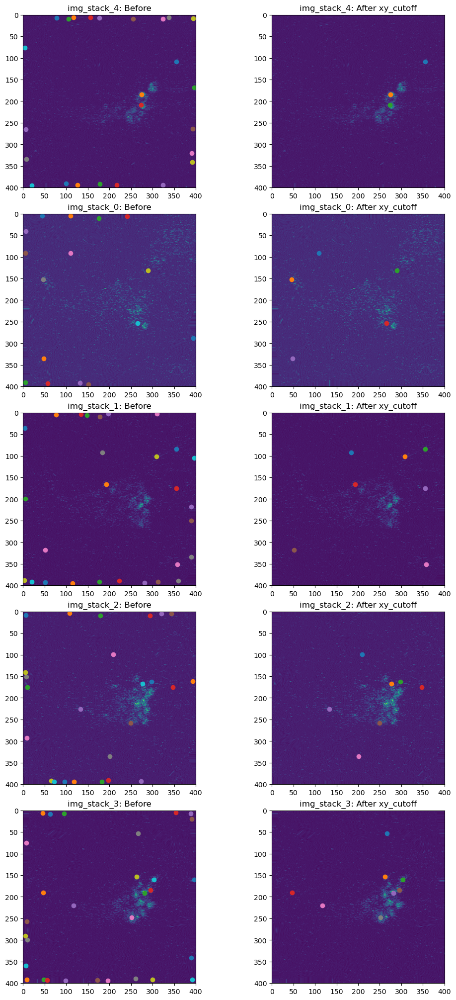

In [11]:
# Remove ROIs at the borders
# 20 for vagal (400 x 400)

xy_cutoff = 20
good_rois = remove_xy(fish, xy_cutoff=xy_cutoff)

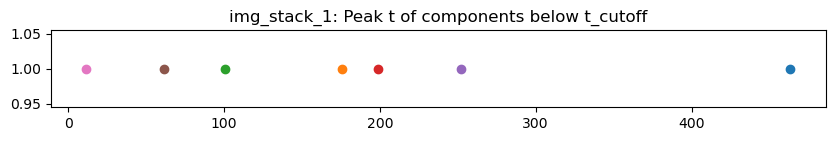

In [25]:
# Look at the distribution of temporal peak values per plane

plane = 1
t_cutoff = 1000

name = f'img_stack_{plane}'
row = mes_df[(mes_df.algo == 'cnmf') & (mes_df.item_name == name)].iloc[0]
plot_t_distribution(row, good_rois[name], t_cutoff=t_cutoff)

Batch exists. Loading batch.pickle
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884-image_els__d1_400_d2_400_d3_1_order_F_frames_778.mmap
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3\bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3-image_els__d1_400_d2_400_d3_1_order_F_frames_779.mmap
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\3746e763-d38a-4a74-b3ac-5179cb0eeae9\3746e763-d38a-4a74-b3ac-5179cb0eeae9-image_els__d1_400_d2_400_d3_1_order_F_frames_779.mmap
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\6f89e7a0-b750-4fa0-8438-2971f

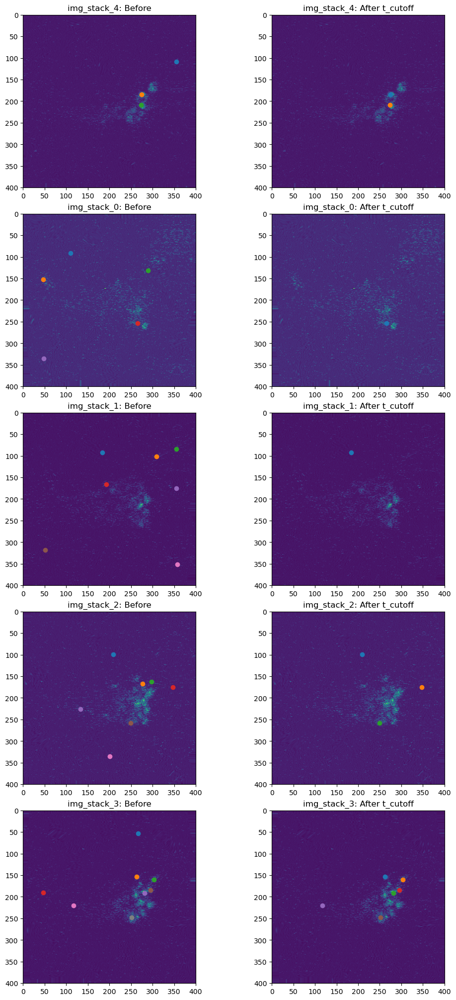

In [12]:
# Remove ROIs with small temporal peak values

t_cutoff = 300
better_rois = remove_low_t(fish, indices=good_rois, t_cutoff=t_cutoff)

Batch exists. Loading batch.pickle
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\cdd2a404-8ca8-47fe-8083-6fec24622884\cdd2a404-8ca8-47fe-8083-6fec24622884-image_els__d1_400_d2_400_d3_1_order_F_frames_778.mmap
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3\bf3ec74c-1e96-4b40-9f7c-c64b3bb96bc3-image_els__d1_400_d2_400_d3_1_order_F_frames_779.mmap
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\3746e763-d38a-4a74-b3ac-5179cb0eeae9\3746e763-d38a-4a74-b3ac-5179cb0eeae9-image_els__d1_400_d2_400_d3_1_order_F_frames_779.mmap
Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\6f89e7a0-b750-4fa0-8438-2971f

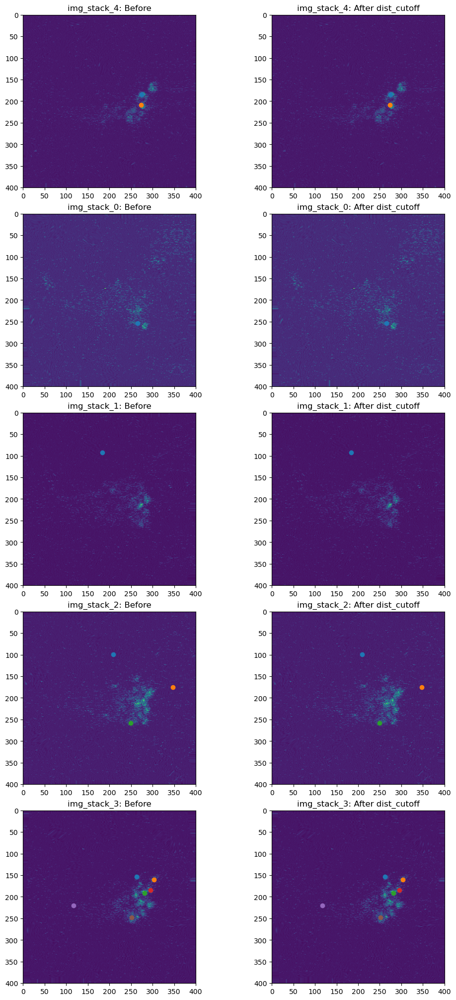

In [13]:
# Remove ROIs with close centers of mass
# 15 for vagal (400 x 400)

dist_cutoff = 15
best_rois = remove_close_dist(fish, indices=better_rois, dist_cutoff=dist_cutoff)

In [14]:
# Create a dictionary of final ROIs

final_rois = best_rois.copy()

Decode mmap filename C:\Users\minel\Documents\data\elavl3H2BGCaMP8m_8dpf_fed_glucose_625mM_53_20230405\postgavage_vagal_L\mesmerize-batch\53a4cc4d-4dbe-4447-a1ae-8517bd26bd70\53a4cc4d-4dbe-4447-a1ae-8517bd26bd70-image_els__d1_400_d2_400_d3_1_order_F_frames_779.mmap


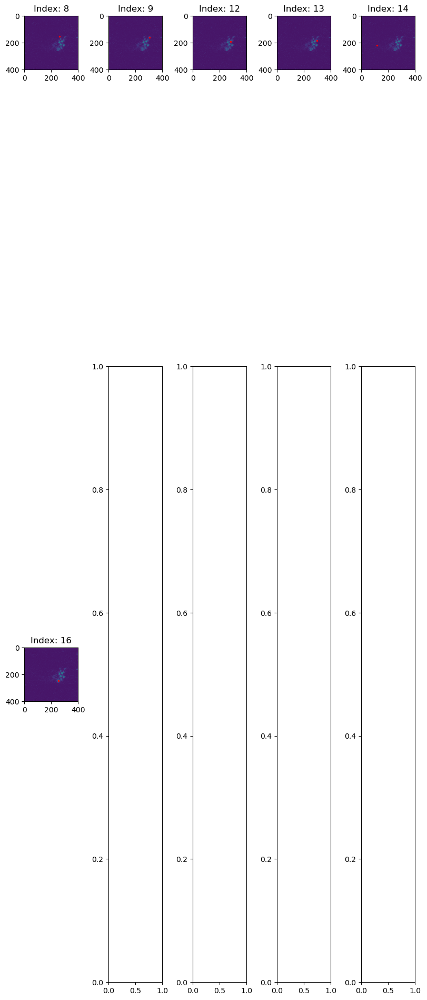

In [19]:
# Remove any additional ROIs manually
# Plot all the ROIs of a single plane to determine the indices of the bad ROIs

plane = 3

name = f'img_stack_{plane}'
row = mes_df[(mes_df.algo=='cnmf') & (mes_df.item_name == name)].iloc[0]
plot_single_rois(row, best_rois[name])

In [20]:
remove_indices = [14]

for ind in remove_indices:
    final_rois[name] = np.delete(final_rois[name], np.where(final_rois[name] == ind))
final_rois

{'img_stack_4': array([11, 13]),
 'img_stack_0': array([9]),
 'img_stack_1': array([], dtype=int32),
 'img_stack_2': array([15]),
 'img_stack_3': array([ 8,  9, 12, 13, 16])}

In [21]:
# Save the final ROIs under mesmerize-batch/final_rois.pickle

save_rois(fish, final_rois)

In [22]:
# Save the final temporal responses under postgavage_path/temporal.h5

save_temporal(fish)

Batch exists. Loading batch.pickle


C:\Users\minel\caImageAnalysis\gavage\mesm.py:1055: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block1_values] [items->Index(['temporal', 'roi_indices'], dtype='object')]

  temporal_df.to_hdf(fish.data_paths['postgavage_path'].joinpath('temporal.h5'), key='temporal')


### Final components

In [23]:
final_rois = load_rois(fish)
final_rois

{'img_stack_4': array([11, 13]),
 'img_stack_0': array([9]),
 'img_stack_2': array([15]),
 'img_stack_3': array([ 8,  9, 12, 13, 16])}

In [24]:
fish = VolumeFish(exp_folder)
temporal_df = load_temporal(fish)
temporal_df

Batch exists. Loading batch.pickle


,plane,temporal,roi_indices,inj_frame
0,0,"[[-38.23267845787511, -17.88879966314006, 25.30919008139431, 19.733593955626944, 14.647237283203525, 10.007193230694...",[9],143
1,2,"[[-91.99679976997189, -91.99679976997189, -91.99679976997189, -91.99679976997189, -91.99679976997189, -91.9967997699...",[15],143
2,3,"[[-46.97724411782223, -46.97724411782223, -46.97724411782223, -46.97724411782223, -46.97724411782223, -46.9772441178...","[8, 9, 12, 13, 16]",143
3,4,"[[-98.91520780034261, -123.93170790640843, -146.75307096132667, 92.76725565259422, 50.93123855947175, 12.76619269473...","[11, 13]",142


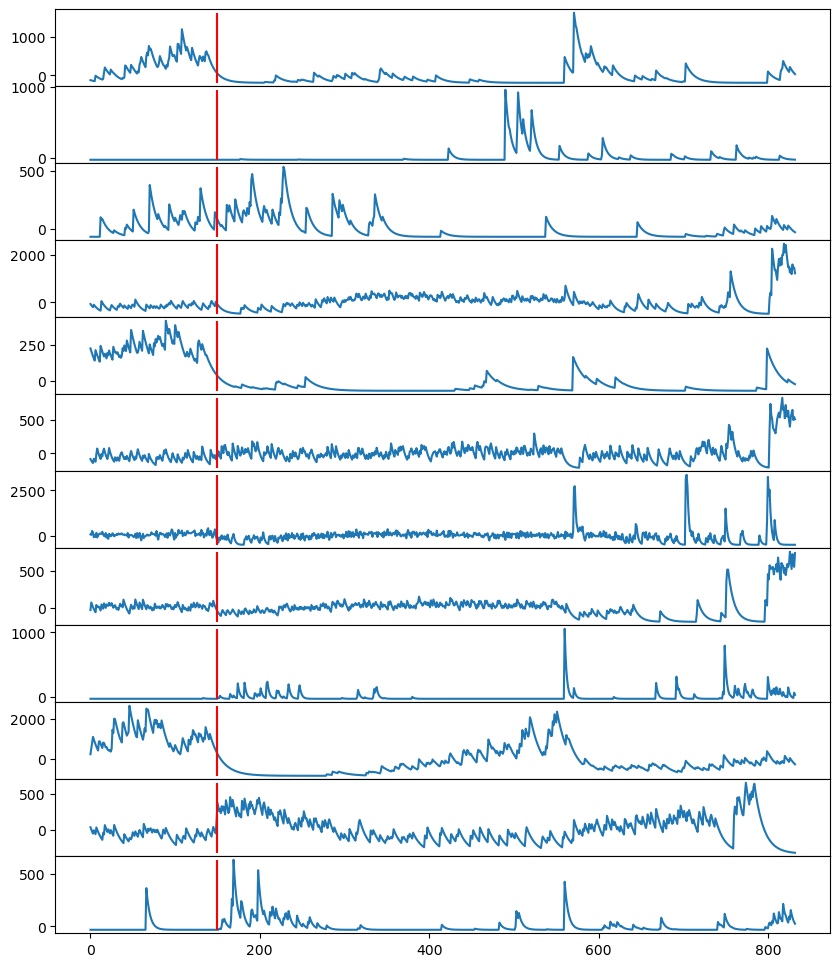

In [81]:
# Plot the individual temporal components per plane

plane = 4

plot_temporal(fish, plane)

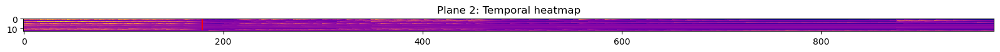

In [44]:
# Plot the temporal components as a heatmap (single plane)

plot_temporal(fish, plane, heatmap=True)

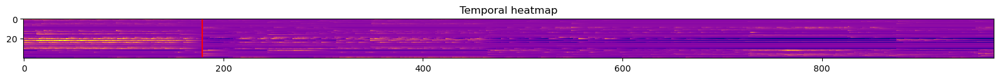

In [43]:
# Plot the temporal components as a heatmap (volume)

temp_volume = plot_temporal_volume(fish, heatmap=True)